In [1]:
import pandas as pd 
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM
from pygam.datasets import mcycle

In [2]:
# read the data 
# merge phenotypic data and imaging data 
nk1 = pd.read_csv('scripts/nkidata/nkidata_summary.csv')
nk2 = pd.read_csv('scripts/nkidata//gm_wm_summary.csv')
nk = pd.merge(nk1,nk2,on=["sub","ses"])
nk3 = pd.read_csv('scripts/nkidata/NKI_participants_New.tsv',sep='\t')
nk = pd.merge(nk,nk3,on=["sub","ses"])

gr1 = pd.read_csv('scripts/grympydata/grmpy_summary.csv')
gr2 = pd.read_csv('scripts/grympydata/gm_wm_summary.csv')
gr = pd.merge(gr1,gr2,on="sub")
gr3=pd.read_csv('scripts/grympydata/demographics.csv')
gr = pd.merge(gr,gr3,on="sub")
#gr4 = pd.read_csv('scripts/grympydata/grmpyALLEligClean.csv')
#gr = pd.merge(gr,gr4,on="sub")

pn1 = pd.read_csv('scripts/pncdata/pncdata_summary.csv')
pn2 = pd.read_csv('scripts/pncdata/gm_wm_summary.csv')
pn = pd.merge(pn1,pn2,on="sub")
pn3 = pd.read_csv('scripts/pncdata/pnc_demographic.csv')
pn = pd.merge(pn,pn3,on="sub")

ags1=pd.read_csv('scripts/ageingdata//ageingdata_summary.csv')
ags2=pd.read_csv('scripts/ageingdata//gm_wm_summary.csv')
ag=pd.merge(ags1,ags2,on="sub")
ags3 =pd.read_excel('scripts/ageingdata//Book1.xlsx',engine='openpyxl')
ags3.head()
ag = pd.merge(ag,ags3,on="sub")

cd1 = pd.read_csv('scripts/ftddata/gm_wm_summary.csv')
cd2 = pd.read_csv('scripts/ftddata/ftddata_summary.csv')
cd=pd.merge(cd2,cd1,on="sub")
cd

,sub,sex,age,task,FD,relRMS,coregDC,coregJC,coregCC,coregCOV,...,CBF_GM,CBF_WM,SCORE_GM,SCORE_WM,SCRUB_GM,SCRUB_WM,BASIL_GM,BASIL_WM,PVC_GM,PVC_WM
0,1013,F,48,rest,0,0,0.999762,0.999525,0.999717,1.0,...,38.545627,26.790831,38.545627,26.790831,38.545627,26.790831,39.291410,28.034024,41.854677,37.260553
1,1014,M,51,rest,0,0,0.999959,0.999917,0.999948,1.0,...,32.077221,24.640210,32.077221,24.640210,32.077221,24.640210,32.736765,25.628437,35.064734,31.343359
2,1015,F,62,rest,0,0,0.999683,0.999366,0.999611,1.0,...,31.087645,22.443745,31.087645,22.443745,31.087645,22.443745,31.736403,23.501762,33.404642,29.703735
3,1016,M,48,rest,0,0,0.999938,0.999876,0.999924,1.0,...,29.448824,24.489827,29.448824,24.489827,29.448824,24.489827,30.177417,25.357178,32.045850,28.704482
4,1017,F,45,rest,0,0,0.999861,0.999721,0.999830,1.0,...,53.020505,32.555960,53.020505,32.555960,53.020505,32.555960,54.173020,34.120213,57.304982,47.204386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,1842,F,63,rest,0,0,1.000000,1.000000,1.000000,1.0,...,55.572652,42.858729,55.572652,42.858729,55.572652,42.858729,56.719010,44.534363,60.469864,55.935507
106,1870,M,30,rest,0,0,1.000000,1.000000,1.000000,1.0,...,42.935097,30.575380,42.935097,30.575380,42.935097,30.575380,43.733687,31.841526,47.393836,41.605835
107,1872,M,61,rest,0,0,1.000000,1.000000,1.000000,1.0,...,32.044981,25.457692,32.044981,25.457692,32.044981,25.457692,32.591059,26.409304,34.622948,30.808007
108,1875,F,32,rest,0,0,1.000000,1.000000,1.000000,1.0,...,38.998939,25.188142,38.998939,25.188142,38.998939,25.188142,39.513256,26.379443,42.645571,36.086312


In [3]:
# Gm_Wm_CBF_ratio and FD
nkt=nk.shape[0]; nk = nk[(nk['GMmeanCBF'] > 5) & (nk['FD'] < 1) ]; nka = nk.shape[0]
grt=gr.shape[0]; gr = gr[(gr['GMmeanCBF'] > 5) & (gr['FD'] < 1) ]; gra = gr.shape[0]
pnt=pn.shape[0]; pn = pn[(pn['GMmeanCBF'] > 5) & (pn['FD'] < 1) ]; pna = pn.shape[0]
agt=ag.shape[0]; ag = ag[(ag['GMmeanCBF'] > 5) & (ag['FD'] < 1) ]; aga = ag.shape[0]
cdt=cd.shape[0]; cd = cd[(cd['GMmeanCBF'] > 5) & (cd['FD'] < 1) ]; cda = cd.shape[0]

print('Total number of subjects run completely : NK:' +str(nkt) + ' PNC:' +str(pnt) + ' IRR:'+str(grt)+ ' FTD:' 
       +str(cdt)+ ' AGE:' +str(agt))

print('Total number of subjects with CBF less than 10 : NK:' +str(nka) + ' PNC:' +str(pna) + ' IRR:'+str(gra)+ ' FTD:' 
       +str(cda)+ ' AGE:' +str(aga))

Total number of subjects run completely : NK:1367 PNC:1515 IRR:161 FTD:110 AGE:63
Total number of subjects with CBF less than 10 : NK:1261 PNC:1481 IRR:159 FTD:110 AGE:63


In [4]:
# combine all the data and label with common names 
agdata1 = pd.DataFrame({'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['CBF_GM'],'CBF WM': ag['CBF_WM'],'CBF TYPE':'CBF','QEI': ag['cbfQEI'], 
                         'NEG_CBF':ag["NEG_CBF_PERC"],'FD':ag['FD'],'AGE':ag['age'],'CBF_R': ag['CBF_GM']/ag['CBF_WM']})
agdata2 = pd.DataFrame({'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['SCORE_GM'],'CBF WM': ag['SCORE_WM'],'CBF TYPE':'SCORE','QEI': ag['scoreQEI'],
                         'NEG_CBF':ag["NEG_SCORE_PERC"],'FD':ag['FD'],'AGE':ag['age'],'CBF_R':ag['SCORE_GM']/ag['SCORE_WM']})
agdata3 = pd.DataFrame({'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['SCRUB_GM'], 'CBF WM': ag['SCRUB_WM'],'CBF TYPE':'SCRUB','QEI': ag['scrubQEI'],
                       'NEG_CBF':ag["NEG_SCRUB_PERC"],'FD':ag['FD'],'AGE':ag['age'],'CBF_R':ag['SCRUB_GM']/ag['SCRUB_WM']})
agdata4 = pd.DataFrame({'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['BASIL_GM'],'CBF WM': ag['BASIL_WM'],'CBF TYPE':'BASIL','QEI': ag['basilQEI'],'FD':ag['FD'],
                      'NEG_CBF':ag["NEG_BASIL_PERC"],'AGE':ag['age'],'CBF_R':ag['BASIL_GM']/ag['BASIL_WM']})
agdata5 = pd.DataFrame({'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['PVC_GM'],'CBF WM': ag['PVC_WM'],'CBF TYPE':'PVC','QEI': ag['pvcQEI'],'FD':ag['FD'],
                       'NEG_CBF':ag["NEG_PVC_PERC"],'AGE':ag['age'],'CBF_R':ag['PVC_GM']/ag['PVC_WM']})


agdata= pd.concat([agdata1,agdata2,agdata3,agdata4,agdata5])


cddata1 = pd.DataFrame({'Datasets': np.repeat('FTD',len(cd)),'CBF GM': cd['CBF_GM'],'CBF WM': cd['CBF_WM'],'CBF TYPE':'CBF','QEI': cd['cbfQEI'],'AGE':cd['age'],
                        'NEG_CBF':cd["NEG_CBF_PERC"],'FD':cd['FD'], 'CBF_R':cd['CBF_GM']/cd['CBF_WM']})
cddata4 = pd.DataFrame({'Datasets': np.repeat('FTD',len(cd)), 'CBF GM': cd['BASIL_GM'], 'CBF WM': cd['BASIL_WM'],'AGE':cd['age'],'CBF TYPE':'BASIL','QEI': cd['basilQEI'],'FD':cd['FD'],
                       'CBF_R':cd['BASIL_GM']/cd['BASIL_WM']})
cddata5 = pd.DataFrame({'Datasets': np.repeat('FTD',len(cd)),'CBF GM': cd['PVC_GM'],'CBF WM': cd['PVC_WM'],'CBF TYPE':'PVC','AGE':cd['age'],'QEI': cd['pvcQEI'],'FD':cd['FD'],
                       'CBF_R':cd['PVC_GM']/cd['PVC_WM']})

cddata= pd.concat([cddata1,cddata4,cddata5])


grdata1 = pd.DataFrame({'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['CBF_GM'],'CBF WM': gr['CBF_WM'],'CBF TYPE':'CBF','QEI': gr['cbfQEI'],
                        'NEG_CBF':gr["NEG_CBF_PERC"],'FD': gr['FD'],'AGE':gr['age'],'CBF_R':gr['CBF_GM']/gr['CBF_WM']})
grdata2 = pd.DataFrame({'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['SCORE_GM'],'CBF WM': gr['SCORE_WM'],'CBF TYPE':'SCORE','QEI': gr['scoreQEI'],
                       'NEG_CBF':gr["NEG_SCORE_PERC"],'FD': gr['FD'],'AGE':gr['age'],'CBF_R':gr['SCORE_GM']/gr['SCORE_WM']})
grdata3 = pd.DataFrame({'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['SCRUB_GM'],'CBF WM': gr['SCRUB_WM'],'CBF TYPE':'SCRUB','QEI': gr['scrubQEI'],
                       'NEG_CBF':gr["NEG_SCRUB_PERC"],'FD': gr['FD'],'AGE':gr['age'],'CBF_R':gr['SCRUB_GM']/gr['SCRUB_WM']})
grdata4 = pd.DataFrame({'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['BASIL_GM'],'CBF WM': gr['BASIL_WM'],'CBF TYPE':'BASIL','QEI': gr['basilQEI'],'FD': gr['FD'],
                        'NEG_CBF':gr["NEG_BASIL_PERC"],'AGE':gr['age'],'CBF_R':gr['BASIL_GM']/gr['BASIL_WM']})
grdata5 = pd.DataFrame({'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['PVC_GM'],'CBF WM': gr['PVC_WM'],'CBF TYPE':'PVC','QEI': gr['pvcQEI'],'FD': gr['FD'],
                        'NEG_CBF':gr["NEG_PVC_PERC"],'AGE':gr['age'],'CBF_R':gr['PVC_GM']/gr['PVC_WM']})


grdata= pd.concat([grdata1,grdata2,grdata3,grdata4,grdata5])


pndata1 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['CBF_GM'],'CBF WM': pn['CBF_WM'],'CBF TYPE':'CBF','QEI': pn['cbfQEI'],
                       'NEG_CBF':pn["NEG_CBF_PERC"],'FD': pn['FD'],'AGE':pn['age'],'CBF_R':pn['CBF_GM']/pn['CBF_WM']})
pndata2 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['SCORE_GM'],'CBF WM': pn['SCORE_WM'],'CBF TYPE':'SCORE','QEI': pn['scoreQEI'],
                       'NEG_CBF':pn["NEG_SCORE_PERC"],'FD': pn['FD'],'AGE':pn['age'],'CBF_R':pn['SCORE_GM']/pn['SCORE_WM']})
pndata3 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['SCRUB_GM'], 'CBF WM': pn['SCRUB_WM'],'CBF TYPE':'SCRUB','QEI': pn['scrubQEI'],
                       'NEG_CBF':pn["NEG_SCRUB_PERC"],'FD': pn['FD'],'AGE':pn['age'],'CBF_R':pn['SCRUB_GM']/pn['SCRUB_WM']})
pndata4 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['BASIL_GM'],'CBF WM': pn['BASIL_WM'], 'CBF TYPE':'BASIL','QEI': pn['basilQEI'],'FD': pn['FD'],
                       'NEG_CBF':pn["NEG_BASIL_PERC"],'AGE':pn['age'],'CBF_R':pn['BASIL_GM']/pn['BASIL_WM']})
pndata5 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['PVC_GM'],'CBF WM': pn['PVC_WM'],'CBF TYPE':'PVC','QEI': pn['pvcQEI'],'FD': pn['FD'],
                       'NEG_CBF':pn["NEG_PVC_PERC"],'AGE':pn['age'],'CBF_R':pn['PVC_GM']/pn['PVC_WM']})

pndata= pd.concat([pndata1,pndata2,pndata3,pndata4,pndata5])

nkdata1 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['CBF_GM'], 'CBF WM': nk['CBF_WM'],'CBF TYPE':'CBF','QEI': nk['cbfQEI'],
                       'NEG_CBF':nk["NEG_CBF_PERC"],'FD': nk['FD'],'AGE':nk['age'],'CBF_R':nk['CBF_GM']/nk['CBF_WM']})
nkdata2 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['SCORE_GM'], 'CBF WM': nk['SCORE_WM'],'CBF TYPE':'SCORE','QEI': nk['scoreQEI'],
                       'NEG_CBF':nk["NEG_SCORE_PERC"],'FD': nk['FD'],'AGE':nk['age'],'CBF_R':nk['SCORE_GM']/nk['SCORE_WM']})
nkdata3 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['SCRUB_GM'],'CBF WM': nk['SCRUB_WM'],'CBF TYPE':'SCRUB','QEI': nk['scrubQEI'],
                       'NEG_CBF':nk["NEG_SCRUB_PERC"],'FD': nk['FD'],'AGE':nk['age'],'CBF_R':nk['SCRUB_GM']/nk['SCRUB_WM']})
nkdata4 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['BASIL_GM'],'CBF WM': nk['BASIL_WM'],'CBF TYPE':'BASIL','QEI': nk['basilQEI'],'FD': nk['FD'],
                       'NEG_CBF':nk["NEG_BASIL_PERC"],'AGE':nk['age'],'CBF_R':nk['BASIL_GM']/nk['BASIL_WM']})
nkdata5 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['PVC_GM'],'CBF WM': nk['PVC_WM'],'CBF TYPE':'PVC','QEI': nk['pvcQEI'],'FD': nk['FD'],
                       'NEG_CBF':nk["NEG_PVC_PERC"],'AGE':nk['age'],'CBF_R':nk['PVC_GM']/nk['PVC_WM']})

nkdata= pd.concat([nkdata1,nkdata2,nkdata3,nkdata4,nkdata5])

gmdata = pd.concat([pndata,nkdata,grdata,cddata,agdata])

,Datasets,CBF GM,CBF WM,CBF TYPE,QEI,NEG_CBF,FD,AGE,CBF_R
0,PNC,61.244823,24.969727,CBF,0.570695,5.120680,0.074179,15.583333,2.452763
1,PNC,97.814553,37.895334,CBF,0.714848,1.828727,0.100632,14.916667,2.581177
2,PNC,58.871023,21.321394,CBF,0.616720,4.625589,0.105408,17.833333,2.761124
3,PNC,122.830142,46.254060,CBF,0.636877,1.080540,0.371775,8.250000,2.655554
4,PNC,64.485041,28.564159,CBF,0.685702,4.528522,0.095680,21.500000,2.257551
...,...,...,...,...,...,...,...,...,...
58,AGE,34.142714,33.100681,PVC,0.601128,0.000000,0.168827,71.000000,1.031481
59,AGE,59.158846,71.930451,PVC,0.276842,0.000000,0.231535,78.000000,0.822445
60,AGE,51.041843,44.549038,PVC,0.294624,0.000000,0.486803,70.000000,1.145745
61,AGE,52.927601,50.260484,PVC,0.554566,0.000000,0.282578,72.000000,1.053066


In [5]:
gmdatax = gmdata[gmdata['CBF_R'] > 1]
gmdatax = gmdatax[gmdatax['CBF GM'] > 20]
gmdatax = gmdatax.dropna()
nkx = gmdatax [(gmdatax['Datasets']=='NKI') & (gmdatax['CBF TYPE']=='CBF')].shape[0]
pnx = gmdatax [(gmdatax['Datasets']=='PNC') & (gmdatax['CBF TYPE']=='CBF')].shape[0]
grx = gmdatax [(gmdatax['Datasets']=='IRR') & (gmdatax['CBF TYPE']=='CBF')].shape[0]
cdx = gmdatax [(gmdatax['Datasets']=='FTD') & (gmdatax['CBF TYPE']=='CBF')].shape[0]
agx = gmdatax [(gmdatax['Datasets']=='AGE') & (gmdatax['CBF TYPE']=='CBF')].shape[0]

print('Total number of subjects CBF (GM/WM) > 1 : NK:' +str(nkx) + ' PNC:' +str(pnx) + ' IRR:'+str(grx)+ ' FTD:' 
       +str(cdx)+ ' AGE:' +str(agx))

Total number of subjects CBF (GM/WM) > 1 : NK:1237 PNC:1481 IRR:154 FTD:108 AGE:57


100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


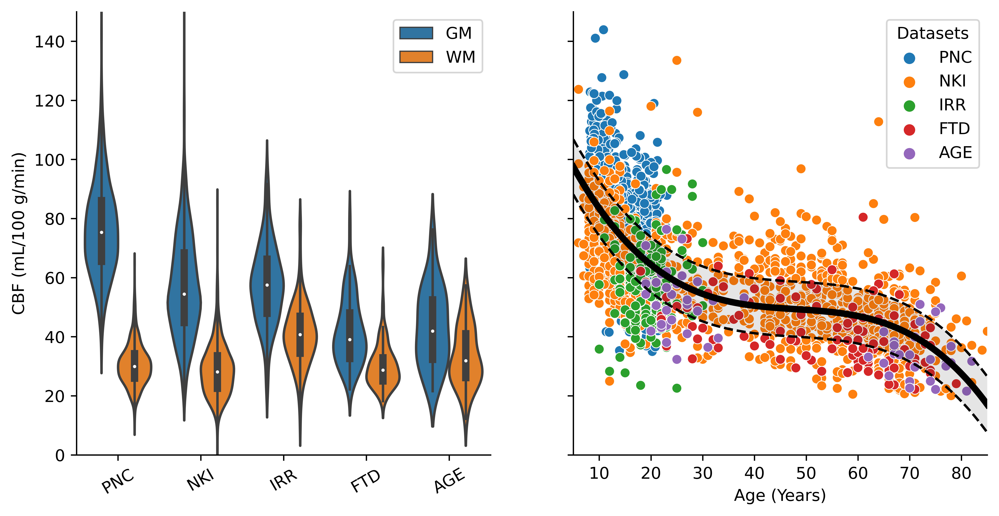

In [7]:
# Figure 2 
import warnings
warnings.filterwarnings("ignore")
gdata=gmdatax[gmdatax['CBF TYPE']=='CBF']
fig, axs = plt.subplots(1,2, sharex=False, sharey=True,dpi=800,figsize=(10,5))
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']
gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[1])

axs[1].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[1].plot(XX, gam.prediction_intervals(XX, width=.5), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.5)
axs[1].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
#bx.set_title(til,fontsize=20);


axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=10)
axs[1].set_xlabel('Age (Years)',fontsize=10)
axs[1].set_ylim(ymin=0,ymax=150)
axs[1].set_xlim(xmin=5,xmax=85)
axs[1].tick_params(labelsize=10)


gda1=gmdatax[['CBF TYPE','CBF GM','Datasets']]
gda2=gmdatax[['CBF TYPE','CBF WM','Datasets']]

gda1['CBF']=gda1['CBF GM']
gda2['CBF']=gda2['CBF WM']
gda1['Tissue Type']=np.repeat('GM',len(gda1))
gda2['Tissue Type']=np.repeat('WM',len(gda2))
gddx=pd.concat([gda1, gda2])
gdx=gddx[gddx['CBF TYPE']=='CBF']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[0],scale='width',x_jitter=.2, scatter_kws={"s": 50,'alpha':0.5})
#bb.axes.set_title("Title",fontsize=50)
axs[0].set_xlabel('',fontsize=20)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=10)
axs[0].tick_params(labelsize=10)
axs[0].set_ylim(ymin=0,ymax=150)
axs[0].legend(title='Tissue', loc='upper right', labels=['GM', 'WM'])
axs[0].legend(fontsize='10', title_fontsize='10')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_xticklabels(labels=['PNC','NKI','IRR','FTD','AGE'],rotation=30)
#ax.get_legend().remove()
plt.savefig('Figure2.png', dpi=800)

In [8]:
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True,dpi=800,figsize=(20,8))

gdata1=gmdatax[gmdatax['CBF TYPE']=='BASIL']
gdata1=gdata1.fillna(0) 
gdata=gdata1
#gdata=gdata[gdata['AGE']<18.3]
#gdata=gdata[gdata['AGE']>8]
#X, y = mcycle(return_X_y=True)
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']

gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[0])
axs[0].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[0].plot(XX, gam.prediction_intervals(XX, width=.5), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.5)
axs[0].legend(fontsize='20', title_fontsize='20')
axs[0].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[0].set_xlabel('Age (Years)',fontsize=30)
axs[0].set_ylim(ymin=0,ymax=150)
axs[0].set_xlim(xmin=5,xmax=85)
axs[0].tick_params(labelsize=30)
axs[0].set_title('BASIL',fontsize=30)


gdata1=gmdata[gmdata['CBF TYPE']=='PVC']
gdata1=gdata1.fillna(0) 
gdata=gdata1 
#gdata=gdata[gdata['AGE']<18.3]
#gdata=gdata[gdata['AGE']>8]
#X, y = mcycle(return_X_y=True)
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']

gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[1])
axs[1].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[1].plot(XX, gam.prediction_intervals(XX, width=.5), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.5)
axs[1].legend(fontsize='10', title_fontsize='10')
axs[1].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[1].set_ylabel('',fontsize=30)
axs[1].set_xlabel('Age (Years)',fontsize=30)
axs[1].set_ylim(ymin=0,ymax=150)
axs[1].set_xlim(xmin=5,xmax=85)
axs[1].tick_params(labelsize=30)
axs[1].set_title('BASIL + PVC',fontsize=30)



gdata1=gmdata[gmdata['CBF TYPE']=='SCRUB']
gdata1=gdata1.fillna(0) 
gdata=gdata1
#gdata=gdata[gdata['AGE']<18.3]
#gdata=gdata[gdata['AGE']>8]
#X, y = mcycle(return_X_y=True)
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']

gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[2])
axs[2].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[2].plot(XX, gam.prediction_intervals(XX, width=.5), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.5)
axs[2].legend(fontsize='30', title_fontsize='30')
axs[2].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[2].set_ylabel('',fontsize=30)
axs[2].set_xlabel('Age (Years)',fontsize=30)
axs[2].set_ylim(ymin=0,ymax=150)
axs[2].set_xlim(xmin=5,xmax=85)
axs[2].tick_params(labelsize=30)
axs[2].set_title('SCRUB',fontsize=30)

axs[1].get_legend().remove()
axs[2].get_legend().remove()
#axs[1,1].get_legend().remove()

plt.savefig('supfigure5.png', dpi=800)

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


In [9]:
gddx=pd.concat([gda1, gda2])
gdx=gddx[gddx['CBF TYPE']=='BASIL']

fig, axs = plt.subplots(3,1, sharex=False, sharey=True,dpi=600,figsize=(10,20) )
fig.subplots_adjust(hspace = 0.5)
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[0],scale='width',order=['PNC','NKI','IRR','AGE','FTD'])
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[0].tick_params(labelsize=30)
axs[0].legend(fontsize='20', title_fontsize='10')
axs[0].set_ylim(ymin=-0.19,ymax=150)
axs[0].set_xlabel('',fontsize=30)
axs[0].set_title('BASIL',fontsize=30)

gdx=gddx[gddx['CBF TYPE']=='PVC']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[1],scale='width',order=['PNC','NKI','IRR','AGE','FTD'])
sns.despine(top=True, right=True, left=False, bottom=False)
#axs[1].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[1].tick_params(labelsize=30)
axs[1].set_ylabel('',fontsize=30)
axs[1].set_ylim(ymin=-0.19,ymax=150)
axs[1].set_xlabel('',fontsize=30)
axs[1].legend([],[], frameon=False)
axs[1].set_title('BASIL + PVC',fontsize=30)


gdx=gddx[gddx['CBF TYPE']=='SCRUB']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[2],scale='width',order=['PNC','NKI','IRR','AGE'])
sns.despine(top=True, right=True, left=False, bottom=False)
#axs[1,1].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[2].tick_params(labelsize=30)
axs[2].set_ylim(ymin=-0.19,ymax=175)
axs[2].set_xlabel('',fontsize=30)
axs[2].set_ylabel('',fontsize=30)
axs[2].legend([],[], frameon=False)
axs[2].set_title('SCRUB',fontsize=30)
plt.savefig('sfigure4.png')

plt.show()
